In [10]:
import os
import sys
sys.path.append('../')

import numpy as np
from matplotlib import pyplot as plt

from models.graph import Graph, load_graph

In [11]:
#plt.rc('font', family='dejavuserif', serif='Times')
#plt.rc('text', usetex=True)
plt.rc('font',**{'family':'sans-serif','sans-serif':['DejaVu Sans'],'size':10})

# Set the font used for MathJax - more on this later
plt.rc('mathtext',**{'default':'regular'})
colors = ['#377eb8', '#ff7f00', '#4daf4a',
          '#f781bf', '#a65628', '#984ea3',
          '#999999', '#e41a1c', '#dede00']
#colors = ['#3e5fbf', '#76a2d2', '#a4d5de', '#d2f5e2', '#ffffe0', '#ffaaa2', '#ea6372', '#c32750', '#93003a']

In [12]:
def plot_rz(X, Ri, Ro, y, save_fig=False, filename="rz.png"):
    X = np.array(X)
    feats_o = np.matmul(Ro.transpose(), X)
    feats_i = np.matmul(Ri.transpose(), X)

    fig = plt.figure(dpi=1000)
    for i in range(len(X)):        
        plt.scatter(X[i][2], X[i][0], c='silver', linewidths=0, marker='s', s=8)

    track_segs_o = feats_o[y>0.5]
    track_segs_i = feats_i[y>0.5]
    for i in range(len(track_segs_o)):
        plt.plot((track_segs_o[i][2], track_segs_i[i][2]),
                 (track_segs_o[i][0], track_segs_i[i][0]),
                  marker='o', ls='-', color='blue', lw=0.2, ms=0.1, alpha=1)
    
    false_edges_o = feats_o[y<0.5]
    false_edges_i = feats_i[y<0.5]
    for i in range(len(false_edges_o)):
        plt.plot((false_edges_o[i][2], false_edges_i[i][2]),
                 (false_edges_o[i][0], false_edges_i[i][0]),
                  marker='o', ls='-', color='black', lw=0.1, ms=0.1, alpha=0.5)

        
    plt.ylabel("r [m]")
    plt.xlabel("z [m]")
    if (save_fig): plt.savefig(filename, dpi=1200)
    plt.show()

In [54]:
pt_cut = '1'
construction = 'testGraph'
graph_dir = '../../../../Ojalvo lab/graphsNPZ/'.format(construction)
graph_paths = [os.path.join(graph_dir, i) for i in os.listdir(graph_dir)]
##graph = load_graph(graph_paths[22])
print(graph_paths)


['../../../../Ojalvo lab/graphsNPZ/testGraph000.npz']


In [23]:
def directSum(a, b):
    return_matrix = np.zeros( np.add(a.shape,b.shape) )
    return_matrix[:a.shape[0],:a.shape[1]]=a
    return_matrix[a.shape[0]:,a.shape[1]:]=b
    return return_matrix

In [57]:
from collections import OrderedDict
column_names = ['X', 'Ra', 'Ri', 'Ro', 'y', 'pid']
graph = load_graph(graph_paths[0])
print(graph[0].shape)
extendableGraph = OrderedDict((key,graph[i]) for i, key in enumerate(column_names))
for i,path in enumerate(graph_paths):
    if i == 0: 
        continue
    graph = load_graph(graph_paths[i])
    for j, key in enumerate(column_names):
        if(j == 2 or j == 3):
            extendableGraph[key] = directSum(extendableGraph[key], graph[j])
        else: 
            extendableGraph[key] = np.concatenate((extendableGraph[key], graph[j]))
print(list(extendableGraph.items())[0][1].shape)
graph = Graph(**extendableGraph)
print(graph[0].shape)
print(graph[1].shape)
print(graph[2].shape)
print(graph[3].shape)
print(graph[4].shape)
print(graph[5].shape)

    

(5955, 3)
(5955, 3)
(5955, 3)
(17836, 4)
(5955, 17836)
(5955, 17836)
(17836,)
(5955, 1)


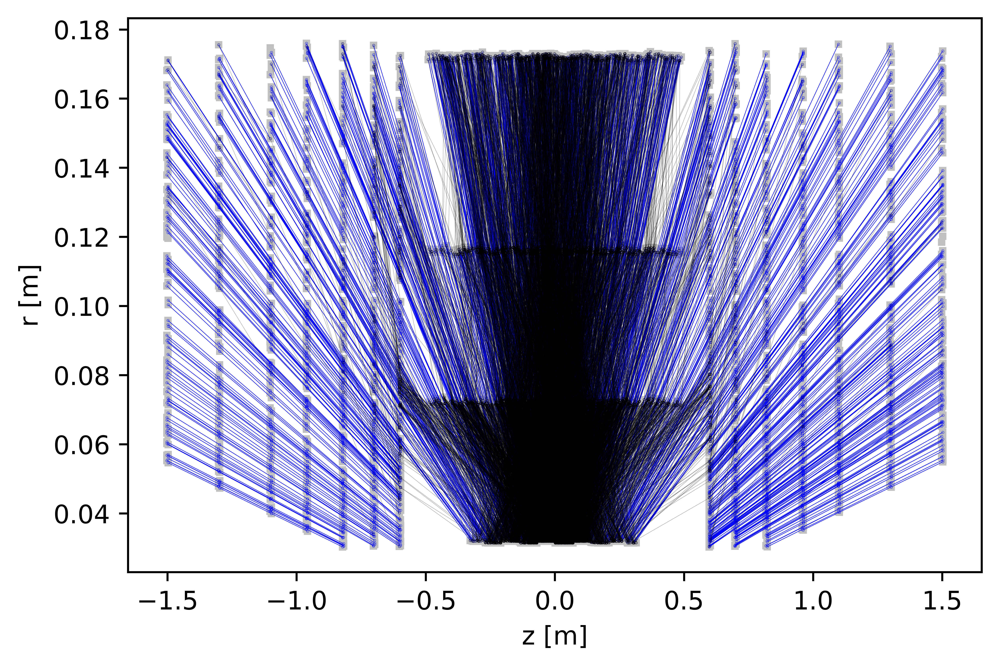

In [58]:
plot_rz(graph.X, graph.Ri, graph.Ro, graph.y)

In [ ]:
plot_rz(dbgraph.X, dbgraph.Ri, dbgraph.Ro, dbgraph.y)

FileNotFoundError: [Errno 2] No such file or directory: '../../hitgraphs/heptrkx_plus_2/event000001027_g000.npz'

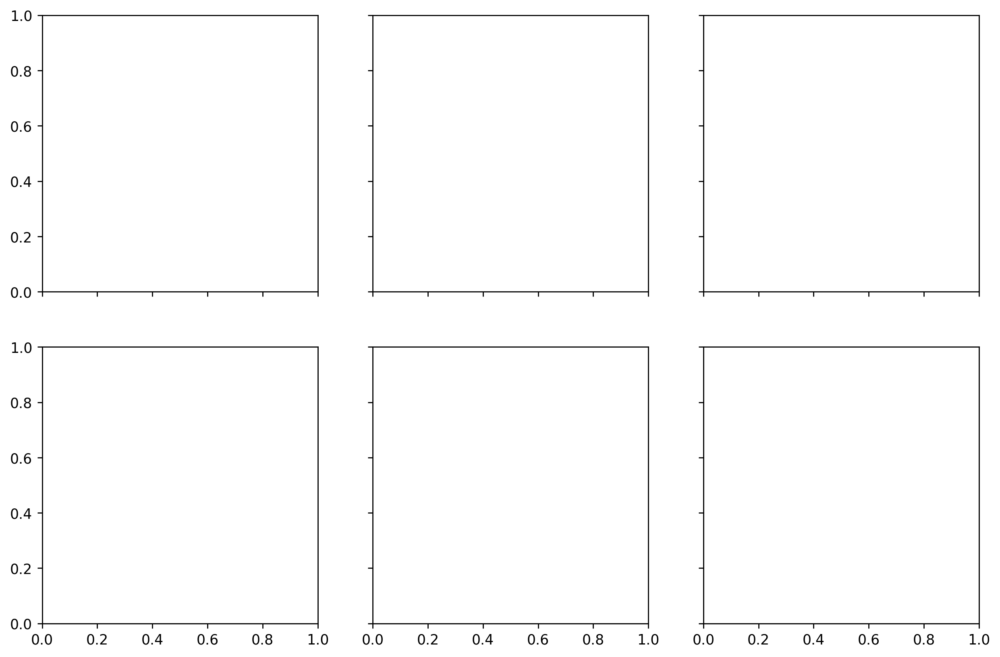

In [33]:
pt_cuts = ['2', '1p5', '1']
evtid = '1027'
construction = 'heptrkx_plus'

fig, axs = plt.subplots(nrows=2, ncols=len(pt_cuts), figsize=(12,8), sharey=True, sharex=True, dpi=250)
for i, pt_cut in enumerate(pt_cuts):
    for j, construction in enumerate(['heptrkx_plus', 'dbgraphs']):
        graph_dir = '../../hitgraphs/{}_{}'.format(construction, pt_cut)

        evt_path = 'event00000'+evtid+'_g000.npz'
        graph = load_graph(os.path.join(graph_dir, evt_path))
    
        X, Ri, Ro, y = graph.X, graph.Ri, graph.Ro, graph.y
        feats_o, feats_i = Ro.transpose() @ X, Ri.transpose() @ X

        track_segs_o = feats_o[y>0.5]
        track_segs_i = feats_i[y>0.5]
        axs[j][i].plot((track_segs_o[:,2], track_segs_i[:,2]),
                       (track_segs_o[:,0], track_segs_i[:,0]),
                        marker='o', ls='-', color='blue', lw=0.2, ms=0.1, alpha=1)
        
        false_edges_o = feats_o[y<0.5]
        false_edges_i = feats_i[y<0.5]
        axs[j][i].plot((false_edges_o[:,2], false_edges_i[:,2]),
                    (false_edges_o[:,0], false_edges_i[:,0]),
                    marker='o', ls='-', color='black', lw=0.1, ms=0.1, alpha=0.2)
    
        axs[j][i].scatter(X[:,2], X[:,0], c='silver', lw=0, marker='s', s=8)
        #axs[j][i].set_box_aspect(1)
        if pt_cut=='1p5': axs[0][i].set_title("$p_T^{min}=$" + " 1.5 GeV", fontsize=16)
        else: axs[0][i].set_title("$p_T^{min}=$" + " {} GeV".format(pt_cut), fontsize=16)
        axs[1][i].set_xticks([-1.5, 0, 1.5])
    
axs[0][0].set_yticks([0.02, 0.18])
axs[1][0].set_yticks([0.02, 0.18])

axs[0][0].set_ylabel("r [m]")
axs02_twin = axs[0][2].twinx()
axs02_twin.set_ylabel("HEP.TrkX+", fontsize=16)
axs02_twin.set_yticklabels([])
axs02_twin.set_yticks([])
axs[1][0].set_ylabel("r [m]")
axs12_twin = axs[1][2].twinx()
axs12_twin.set_ylabel("DBSCAN", fontsize=16)
axs12_twin.set_yticklabels([])
axs12_twin.set_yticks([])
axs[1][1].set_xlabel("z [m]")
plt.tight_layout()
plt.savefig('graph_construction_staggered_pt.pdf', bbox_inches = 'tight')
plt.show()

In [7]:
pt = [2, 1.5, 1, 0.75, 0.6, 0.5]
purity = {'dbscan': [0.984, None, None, None, None, None],
          'heptrkx_plus': [0.984, 0.984, 0.981, 0.977, 0.97, 0.938],
          'heptrkx_classic': [0.99, 0.991, 0.989, 0.986, 0.985, 0.956]}
purity_err = {'heptrkx_plus': [0.006, 0.004, 0.003, 0.003, 0.003, 0.004],
              'heptrkx_classic': [0.006, 0.004, 0.003, 0.003, 0.002, 0.004]}
efficiency = {   'heptrkx_plus': [0.414, 0.27, 0.141, 0.091, 0.066, 0.051],
              'heptrkx_classic': [0.686, 0.587, 0.415, 0.308, 0.203, 0.199]}
efficiency_err = {   'heptrkx_plus': [0.047, 0.033, 0.018, 0.012, 0.008, 0.006],
                  'heptrkx_classic': [0.076, 0.054, 0.039, 0.031, 0.021, 0.021]}
n_edges = {'heptrkx_plus': [2079.781, 6628.585, 29846.968, 77415.891, 149991.694, 239569.778],
           'heptrkx_classic': [652.894, 1514.401, 4841.349, 10667.158, 22571.311, 28390.97]}
n_edges_err = {'heptrkx_plus': [556.875, 1800.575, 7992.864, 20147.34, 37740.83, 58785.161],
               'heptrkx_classic': [192.718, 380.904, 1154.555, 2534.7, 5238.850, 6579.619]}
n_nodes = {'heptrkx_plus': [1092.532, 2256.196, 5293.043, 8864.85, 12586.671, 16100.121],
           'heptrkx_classic': [639.416, 1280.661, 2909.972, 4776.958, 6696.739, 8490.047]}
n_nodes_err = {'heptrkx_plus': [180.4, 353.267, 765.541, 1209.71, 1633.279, 2025.652],
               'heptrkx_classic': [112.086, 207.646, 430.794, 663.36, 846.323, 1082.274]}
size = {'heptrkx_plus': [4.779, 31.295, 328.755, 1422.5446, 3901.385, 7855.988],
        'heptrkx_classic': [0.895, 4.081, 29.328, 105.627, 310.256, 497.254]}
size_err = {'heptrkx_plus': [2.054, 13.403, 135.279, 564.097, 1489.24, 2955.035],
            'heptrkx_classic': [0.419, 1.671, 11.264, 39.644, 111.639, 178.47]}

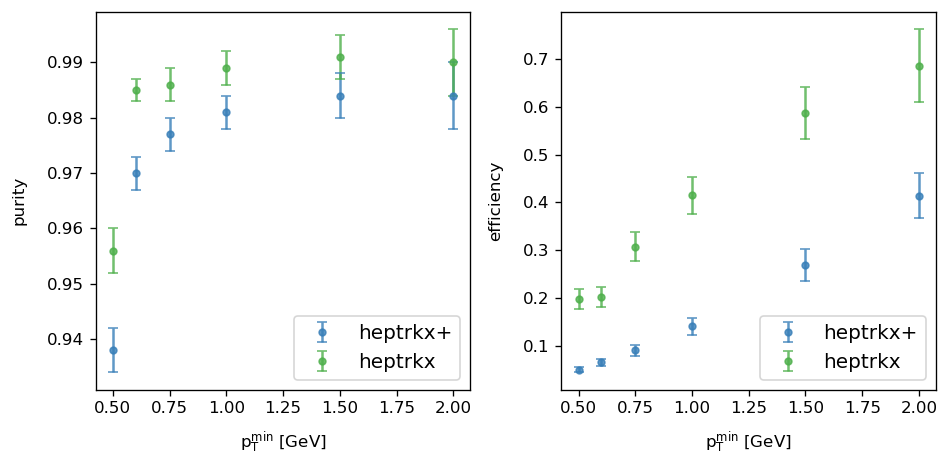

In [8]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=120)
axs[0].errorbar(pt, purity['heptrkx_plus'], yerr=purity_err['heptrkx_plus'], 
             label='heptrkx+', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
             color=colors[0])
axs[0].errorbar(pt, purity['heptrkx_classic'], yerr=purity_err['heptrkx_classic'], 
             label='heptrkx', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
             color=colors[2])
axs[0].legend(loc='lower right', fontsize=12)
axs[0].set_xlabel('$p_T^{min}$ [GeV]', labelpad=8)
axs[0].set_ylabel('purity', labelpad=12)

axs[1].errorbar(pt, efficiency['heptrkx_plus'], yerr=efficiency_err['heptrkx_plus'], 
                label='heptrkx+', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
                color=colors[0])
axs[1].errorbar(pt, efficiency['heptrkx_classic'], yerr=efficiency_err['heptrkx_classic'], 
                label='heptrkx', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
                color=colors[2])
axs[1].legend(loc='lower right', fontsize=12)
axs[1].set_xlabel('$p_T^{min}$ [GeV]', labelpad=8)
axs[1].set_ylabel('efficiency', labelpad=12)

plt.tight_layout()
plt.show()


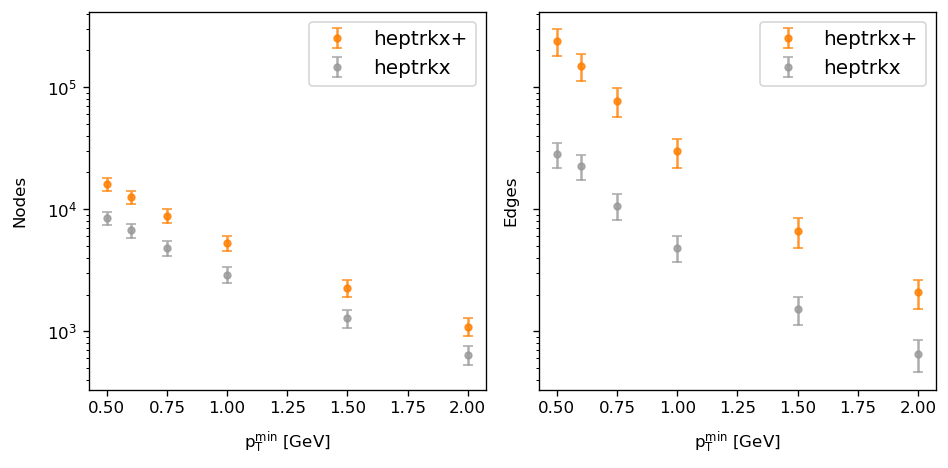

In [9]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=120, sharey=True)
axs[0].errorbar(pt, n_nodes['heptrkx_plus'], yerr=n_nodes_err['heptrkx_plus'], 
             label='heptrkx+', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
             color=colors[1])
axs[0].errorbar(pt, n_nodes['heptrkx_classic'], yerr=n_nodes_err['heptrkx_classic'], 
             label='heptrkx', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
             color=colors[6])
axs[0].legend(loc='upper right', fontsize=12)
axs[0].set_xlabel('$p_T^{min}$ [GeV]', labelpad=8)
axs[0].set_ylabel('Nodes', labelpad=12)
axs[0].set_yscale('log')

axs[1].errorbar(pt, n_edges['heptrkx_plus'], yerr=n_edges_err['heptrkx_plus'], 
                label='heptrkx+', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
                color=colors[1])
axs[1].errorbar(pt, n_edges['heptrkx_classic'], yerr=n_edges_err['heptrkx_classic'], 
                label='heptrkx', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
                color=colors[6])
axs[1].legend(loc='upper right', fontsize=12)
axs[1].set_xlabel('$p_T^{min}$ [GeV]', labelpad=8)
axs[1].set_ylabel('Edges', labelpad=12)
axs[1].set_yscale('log')

plt.tight_layout()
plt.show()

In [10]:
### Paper Measurements: 2, 1p5, 1, 0p75, 0p6
pt = [2, 1.5, 1, 0.75, 0.6, 0.5]
purity = {'heptrkx_plus': [0.984, 0.984, 0.981, 0.977, 0.977, 0.938],
          'heptrkx_classic': [0.99, 0.991, 0.989, 0.986, 0.983, 0.956]}
purity_err = {'heptrkx_plus': [0.006, 0.004, 0.003, 0.003, 0.002, 0.004],
              'heptrkx_classic': [0.006, 0.004, 0.003, 0.003, 0.003, 0.004]}
efficiency = {'heptrkx_plus': [0.414, 0.27, 0.141, 0.091, 0.053, 0.051],
              'heptrkx_classic': [0.686, 0.587, 0.415, 0.308, 0.243, 0.199]}
efficiency_err = {'heptrkx_plus': [0.047, 0.033, 0.018, 0.012, 0.007, 0.006],
                  'heptrkx_classic': [0.076, 0.054, 0.039, 0.031, 0.025, 0.021]}
n_edges = {'heptrkx_plus': [2079.781, 6628.585, 29846.968, 77415.891, 188297.554, 239569.778],
           'heptrkx_classic': [652.894, 1514.401, 4841.349, 10667.158, 18864.254, 28390.97]}
n_edges_err = {'heptrkx_plus': [556.875, 1800.575, 7992.864, 20147.34, 47704.141, 58785.161],
               'heptrkx_classic': [192.718, 380.904, 1154.555, 2534.7, 4444.961, 6579.619]}
n_nodes = {'heptrkx_plus': [1092.532, 2256.196, 5293.043, 8864.85, 12586.671, 16100.121],
           'heptrkx_classic': [639.416, 1280.661, 2909.972, 4776.958, 6696.739, 8490.047]}
n_nodes_err = {'heptrkx_plus': [180.4, 353.267, 765.541, 1209.71, 1633.279, 2025.652],
               'heptrkx_classic': [112.086, 207.646, 430.794, 663.36, 886.101, 1082.274]}
size = {'heptrkx_plus': [4.779, 31.295, 328.755, 1422.5446, 4898.790, 7855.988],
        'heptrkx_classic': [0.895, 4.081, 29.328, 105.627, 261.154, 497.254]}
size_err = {'heptrkx_plus': [2.054, 13.403, 135.279, 564.097, 1878.372, 2955.035],
            'heptrkx_classic': [0.419, 1.671, 11.264, 39.644, 96.059, 178.47]}

In [5]:
# for paper
pt = [2, 1.5, 1, 0.75, 0.6, 0.5]
pt_shift_up = [2.01, 1.51, 1.01, 0.76, 0.61, 0.51]
pt_shift_down = [1.99, 1.49, 0.99, 0.74, 0.59, 0.49]
purity = {'dbscan': [0.984, 0.984, 0.981, 0.979, 0.975, 0.972],
          'heptrkx_plus': [0.984, 0.984, 0.981, 0.980, 0.977, 0.973],
          'heptrkx_classic': [0.99, 0.991, 0.989, 0.988, 0.986, 0.982]}
purity_err = {'dbscan': [0.006, 0.004, 0.003, 0.003, 0.003, 0.002],
              'heptrkx_plus': [0.006, 0.004, 0.003, 0.003, 0.002, 0.002],
              'heptrkx_classic': [0.006, 0.004, 0.003, 0.002, 0.002, 0.002]}
efficiency = {'dbscan': [0.741, 0.526, 0.237, 0.137, 0.107, 0.058],
              'heptrkx_plus': [0.414, 0.27, 0.141, 0.073, 0.053, 0.042],
              'heptrkx_classic': [0.686, 0.587, 0.415, 0.260, 0.202, 0.167]}
efficiency_err = {'dbscan': [0.082, 0.125, 0.087, 0.058, 0.046, 0.020],
                  'heptrkx_plus': [0.047, 0.033, 0.018, 0.010, 0.007, 0.005],
                  'heptrkx_classic': [0.076, 0.054, 0.039, 0.028, 0.022, 0.018]}
n_edges = {'dbscan': [1159.552, 3628.285, 19962.241, 58905.711, 106391.482, 237671.884],
           'heptrkx_plus': [2079.781, 6628.585, 29846.968, 96667.891, 188297.554, 302023.056],
           'heptrkx_classic': [652.894, 1514.401, 4841.349, 12698, 22786, 34557.432]}
n_edges_err = {'dbscan': [310.292, 1516.747, 8840.562, 26863.593, 47540.451, 16109.012],
               'heptrkx_plus': [556.875, 1800.575, 7992.864, 25399.34, 47704.141, 74446.692],
               'heptrkx_classic': [192.718, 380.904, 1154.555, 3106, 5494, 8195.7]}
n_nodes = {'dbscan': [1092.532, 2256.195, 5294.043, 8864.849, 12520.967, 16109.563],
           'heptrkx_plus': [1092.532, 2256.196, 5294.043, 8864.85, 12586.671, 16100.121],
           'heptrkx_classic': [639.416, 1280.661, 2909.972, 4777, 6696.739, 8490.047]}
n_nodes_err = {'dbscan': [180.4, 353.267, 765.541, 1209.708, 1568.135, 2092.563],
               'heptrkx_plus': [180.4, 353.267, 765.541, 1209.71, 1633.279, 2025.652],
               'heptrkx_classic': [112.086, 207.646, 430.794, 663, 886.101, 1082.274]}
size = {'dbscan': [2.657, 17.414, 223.669, 1107.966, 2809.582, 8022.837],
        'heptrkx_plus': [4.779, 31.295, 328.755, 177.5446, 4898.790, 10031.376],
        'heptrkx_classic': [0.895, 4.081, 29.328, 126, 315.670, 609.060]}
size_err = {'dbscan': [1.143, 10.131, 130.732, 649.222, 1592.900, 3935.264],
            'heptrkx_plus': [2.054, 13.403, 135.279, 709.030, 1878.372, 3736.990],
            'heptrkx_classic': [0.419, 1.671, 11.264, 48.120, 117.846, 221.054]}

In [6]:

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12,6), dpi=1000, sharex='col')
axs[1][0].set_xticks([0.5, 0.6, 0.75, 1, 1.5, 2])
axs[1][1].set_xticks([0.5, 0.6, 0.75, 1, 1.5, 2])
axs[1][0].set_xticklabels([0.5, 0.6, 0.75, 1, 1.5, 2])
axs[1][1].set_xticklabels([0.5, 0.6, 0.75, 1, 1.5, 2])
a00_heptrkx = axs[0][0].errorbar(pt, purity['heptrkx_classic'], yerr=purity_err['heptrkx_classic'], 
                                 label='HEP.TrkX', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
                                 color=colors[0])
a00_heptrkxp = axs[0][0].errorbar(pt_shift_down, purity['heptrkx_plus'], yerr=purity_err['heptrkx_plus'], 
                                  label='HEP.TrkX+', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
                                  color=colors[5])
a00_dbscan = axs[0][0].errorbar(pt_shift_up, purity['dbscan'], yerr=purity_err['dbscan'], 
                                label='DBSCAN', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
                                color=colors[2])
#axs[0][0].legend(loc='lower right', fontsize=12)
#axs[0][0].set_xlabel('$p_T^{min}$ [GeV]', labelpad=8)
axs[0][0].set_ylabel('Truth Efficency', labelpad=12, fontsize=12)
axs[0][0].set_ylim([0.96,1])
axs[0][1].errorbar(pt_shift_down, efficiency['heptrkx_classic'], yerr=efficiency_err['heptrkx_classic'], 
                label='heptrkx', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
                color=colors[0])
axs[0][1].errorbar(pt, efficiency['heptrkx_plus'], yerr=efficiency_err['heptrkx_plus'], 
                label='heptrkx+', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
                color=colors[5])
axs[0][1].errorbar(pt_shift_up, efficiency['dbscan'], yerr=efficiency_err['dbscan'], 
                label='DBSCAN', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
                color=colors[2])
#axs[0][1].legend(loc='lower right', fontsize=12)
#axs[0][1].set_xlabel('$p_T^{min}$ [GeV]', labelpad=8)
axs[0][1].set_ylabel('Edge Efficiency', labelpad=12, fontsize=12)
axs[1][0].errorbar(pt, n_nodes['heptrkx_classic'], yerr=n_nodes_err['heptrkx_classic'], 
             label='heptrkx', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
             color=colors[0])
axs[1][0].errorbar(pt_shift_down, n_nodes['heptrkx_plus'], yerr=n_nodes_err['heptrkx_plus'], 
             label='heptrkx+', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
             color=colors[5])
axs[1][0].errorbar(pt_shift_up, n_nodes['dbscan'], yerr=n_nodes_err['dbscan'], 
             label='DBSCAN', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
             color=colors[2])
#axs[1][0].legend(loc='upper right', fontsize=12)
axs[1][0].set_xlabel('$p_T^{min}$ [GeV]', labelpad=8)
axs[1][0].set_ylabel('$n_{nodes}$', labelpad=12, fontsize=14)
axs[1][0].set_yscale('log')

axs[1][1].errorbar(pt_shift_down, n_edges['heptrkx_classic'], yerr=n_edges_err['heptrkx_classic'], 
                label='heptrkx', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
                color=colors[5])
axs[1][1].errorbar(pt, n_edges['heptrkx_plus'], yerr=n_edges_err['heptrkx_plus'], 
                label='heptrkx+', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
                color=colors[0])
axs[1][1].errorbar(pt_shift_up, n_edges['dbscan'], yerr=n_edges_err['dbscan'], 
                label='DBSCAN', ls='', marker='.', ms=8, alpha=0.8, capsize=3,
                color=colors[2])

#axs[1][1].legend(loc='upper right', fontsize=12)
axs[1][1].set_xlabel('$p_T^{min}$ [GeV]', labelpad=8)
axs[1][1].set_ylabel('$n_{edges}$', labelpad=12, fontsize=14)
axs[1][1].set_yscale('log')

axs[0][0].legend(handles=[a00_heptrkx, a00_heptrkxp, a00_dbscan], loc='lower right') #bbox_to_anchor=[0.16, 1.10], fancybox=True, prop={'size': 12})
plt.tight_layout()
plt.savefig('build_measurements.pdf', bbox_inches = 'tight', format='pdf')
plt.show()
